# Algoritmo KNN - Modelo Binário

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.ensemble import RandomForestClassifier

In [ ]:
df = pd.read_csv('/content/winequality.csv')
df.head()

,Unnamed: 0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_is_red
0,0,5.9,0.61,0.08,2.1,0.071,16.0,24.0,0.99376,3.56,0.77,11.1,6,1
1,1,8.2,1.00,0.09,2.3,0.065,7.0,37.0,0.99685,3.32,0.55,9.0,6,1
2,2,6.4,0.24,0.49,5.8,0.053,25.0,120.0,0.99420,3.01,0.98,10.5,6,0
3,3,6.6,0.23,0.26,1.3,0.045,16.0,128.0,0.99340,3.36,0.60,10.0,6,0
4,4,7.2,0.24,0.29,3.0,0.036,17.0,117.0,0.99411,3.36,0.68,10.1,6,0


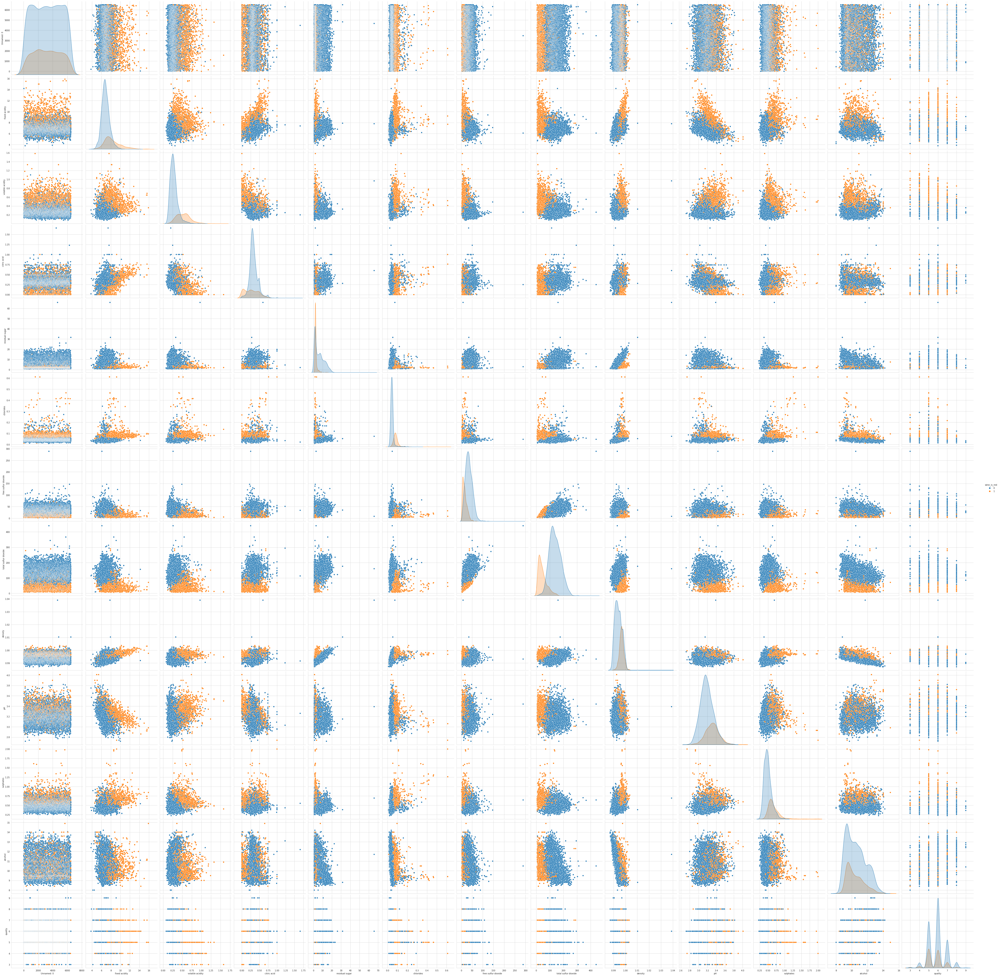

In [ ]:
# NÃO RODAR NÃO RODAR NÃO RODAR NÃO RODAR NÃO RODAR NÃO RODAR NÃO RODAR NÃO RODAR NÃO RODAR 
plt.close(); # NÃO RODAR
sns.set_style('whitegrid');
sns.pairplot(df, hue='wine_is_red', height=3);
plt.show()   #não recomendo rodar de novo, muito pesado kkkkkkkkkkkkk

## 1 - Tratando o banco:

In [ ]:
print(df.shape,np.unique(df.isna().to_numpy(),return_counts=True)) #sem nenhum NA

(6497, 14) (array([False]), array([90958]))


In [ ]:
df.isna().sum()

Unnamed: 0              0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
wine_is_red             0
dtype: int64

In [ ]:
# normalizando:

for i in df.columns:
  df[i] = (df[i] - df[i].min()) / (df[i].max() - df[i].min())

df.head()

,Unnamed: 0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_is_red
0,0.000000,0.173554,0.353333,0.048193,0.023006,0.102990,0.052083,0.041475,0.128205,0.651163,0.308989,0.449275,0.5,1.0
1,0.000154,0.363636,0.613333,0.054217,0.026074,0.093023,0.020833,0.071429,0.187777,0.465116,0.185393,0.144928,0.5,1.0
2,0.000308,0.214876,0.106667,0.295181,0.079755,0.073090,0.083333,0.262673,0.136688,0.224806,0.426966,0.362319,0.5,0.0
3,0.000462,0.231405,0.100000,0.156627,0.010736,0.059801,0.052083,0.281106,0.121265,0.496124,0.213483,0.289855,0.5,0.0
4,0.000616,0.280992,0.106667,0.174699,0.036810,0.044850,0.055556,0.255760,0.134953,0.496124,0.258427,0.304348,0.5,0.0


Agora, veremos como está distribuído nosso *dataframe* sobre as respostas da variável "wine_is_red"

In [ ]:
df.wine_is_red.value_counts()

0.0    4898
1.0    1599
Name: wine_is_red, dtype: int64

In [ ]:
# igualizando o número de observações de cada classe

df_red = df[df.wine_is_red==1]
df_white = df[df.wine_is_red==0]

df_white = resample(df_white, replace = False, n_samples = 1599)

df = pd.concat([df_white,df_red])

df.wine_is_red.value_counts()

1.0    1599
0.0    1599
Name: wine_is_red, dtype: int64

## 2 - Implementação

In [ ]:
# Separando nosso df em treino e teste:

x = df.drop(columns='wine_is_red')
y = df.wine_is_red

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle = True)

x_train = np.array(x_train) 
x_test = np.array(x_test) 
y_train = np.array(y_train) 
y_test = np.array(y_test)

In [ ]:
# distancia = ((a1 - a2)^2 + (b1-b2)^2 + ... + (m1 - m2)^2 )^0.5, sendo a1,...,m1 = treino e a2,...,m2 = teste, m é a 13ª letra do alfabeto, 
# usada porque o x_train possui 13 variáveis (ou dimensões)

d = [np.sqrt(np.sum(np.square((i - x_train)), axis=1)) for i in x_test]

kk = len(d)
kk

640

In [ ]:
resposta = np.array([]) #array das classificações com maior frequência
k = 5 #k vizinhos mais próximos do ponto

In [ ]:
for i in range(kk):
  indices = d[i].argsort()[:k] #índice de cada ponto mais próximo 
  neighbors = [] #k vizinhos mais próximos do ponto são guardados aqui
  for j in range(k):
    neighbors.append(y_train[indices[j]]) #classificacao dos pontos
  resposta = np.append(resposta,max(set(neighbors), key=neighbors.count)) #classificação mais frequente

In [ ]:
c = 0

for i in range(kk):
  if resposta[i] == y_test[i]:
    c += 1

print(f'Eficiência do algoritmo: {round((c/len(d))*100,2)}%')

Eficiência do algoritmo: 99.22%


In [ ]:
pd.crosstab(y_test,resposta, rownames = ['Gabarito'], colnames = ['Predição']) #


Predição,0.0,1.0
Gabarito,,
0.0,325,5
1.0,0,310


## Efeito de não normalizar o banco:

In [ ]:
df = pd.read_csv('/content/winequality.csv')
df.head()

,Unnamed: 0,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_is_red
0,0,5.9,0.61,0.08,2.1,0.071,16.0,24.0,0.99376,3.56,0.77,11.1,6,1
1,1,8.2,1.00,0.09,2.3,0.065,7.0,37.0,0.99685,3.32,0.55,9.0,6,1
2,2,6.4,0.24,0.49,5.8,0.053,25.0,120.0,0.99420,3.01,0.98,10.5,6,0
3,3,6.6,0.23,0.26,1.3,0.045,16.0,128.0,0.99340,3.36,0.60,10.0,6,0
4,4,7.2,0.24,0.29,3.0,0.036,17.0,117.0,0.99411,3.36,0.68,10.1,6,0


In [ ]:
print((f'Antes: \n {df.wine_is_red.value_counts()}'))

Antes: 
 0    4898
1    1599
Name: wine_is_red, dtype: int64


In [ ]:
df_red = df[df.wine_is_red==1]
df_white = df[df.wine_is_red==0]

df_white = resample(df_white, replace = False, n_samples = 1599)

df = pd.concat([df_white,df_red])

print(f'Depois: \n {df.wine_is_red.value_counts()}')

Depois: 
 1    1599
0    1599
Name: wine_is_red, dtype: int64


In [ ]:
# Separando nosso df em treino e teste:

x = df.drop(columns='wine_is_red')
y = df.wine_is_red

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, shuffle = True)

x_train = np.array(x_train) 
x_test = np.array(x_test) 
y_train = np.array(y_train) 
y_test = np.array(y_test)

In [ ]:
# distancia = ((a1 - a2)^2 + (b1-b2)^2 + ... + (m1 - m2)^2 )^0.5, sendo a1,...,m1 = treino e a2,...,m2 = teste, m é a 13ª letra do alfabeto, 
# usada porque o x_train possui 13 variáveis (ou dimensões)

d = [np.sqrt(np.sum(np.square((i - x_train)), axis=1)) for i in x_test]

kk = len(d)
kk

640

In [ ]:
resposta = np.array([]) #array das classificações com maior frequência
k = 5 #k vizinhos mais próximos do ponto

In [ ]:
for i in range(kk):
  indices = d[i].argsort()[:k] #índice de cada ponto mais próximo 
  neighbors = [] #k vizinhos mais próximos do ponto são guardados aqui
  for j in range(k):
    neighbors.append(y_train[indices[j]]) #classificacao dos pontos
  resposta = np.append(resposta,max(set(neighbors), key=neighbors.count)) #classificação mais frequente

In [ ]:
c = 0

for i in range(kk):
  if resposta[i] == y_test[i]:
    c += 1

print(f'Eficiência do algoritmo: {round((c/len(d))*100,2)}%')

Eficiência do algoritmo: 88.44%


In [ ]:
pd.crosstab(y_test,resposta, rownames = ['Gabarito'], colnames = ['Predição'])

Predição,0.0,1.0
Gabarito,,
0,281,26
1,48,285


Não normalizar o banco chega a diminuir a precisão em mais de 10%